In [2]:
import numpy as np
import matplotlib.pyplot as plt
import umap
import numpy.linalg as la

In [3]:
#Fashion mnist
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import model_selection
from sklearn import linear_model, ensemble, tree, neighbors, svm
from mnist.loader import MNIST

In [4]:
print("Fetching Fashion-Mnist")
print("=========================")
mndata = MNIST('../fashion-mnist/data/fashion') #added path extension for new file structure
train, train_labels = mndata.load_training()
test, test_labels = mndata.load_testing()
data = np.array(np.vstack([train, test]), dtype=np.float64) / 255.0
target = np.hstack([train_labels, test_labels])
classes = [
    'T-shirt/top',
    'Trouser', 
    'Pullover',
    'Dress',
    'Coat',
    'Sandal',
    'Shirt',
    'Sneaker',
    'Bag',
    'Ankle boot']
print("Fashion-Mnist loaded")
print ("=========================")

Fetching Fashion-Mnist
Fashion-Mnist loaded


## Testing Stable OpenCV rotations instead of custom function

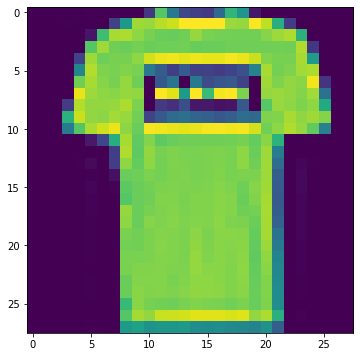

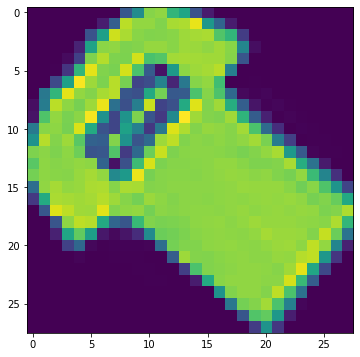

"\ncv.imshow('Source image', src)\ncv.imshow('Warp', warp_dst)\ncv.imshow('Warp + Rotate', warp_rotate_dst)\ncv.waitKey()\n"

In [17]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
src=np.reshape(data[1],(28,28))
srcTri = np.array( [[0, 0], [src.shape[1] - 1, 0], [0, src.shape[0] - 1]] ).astype(np.float32)
dstTri = np.array( [[0, src.shape[1]*0.33], [src.shape[1]*0.85, src.shape[0]*0.25], [src.shape[1]*0.15, src.shape[0]*0.7]] ).astype(np.float32)
warp_mat = cv.getAffineTransform(srcTri, dstTri)
warp_dst = cv.warpAffine(src, warp_mat, (src.shape[1], src.shape[0]))

# Rotating the image after Warp
center = (warp_dst.shape[1]//2, warp_dst.shape[0]//2)
angle = 50
scale = 1

rot_mat = cv.getRotationMatrix2D( center, angle, scale )
warp_rotate_dst = cv.warpAffine(src, rot_mat, (src.shape[1], src.shape[0]))
#warp_rotate_dst = cv.warpAffine(warp_dst, rot_mat, (warp_dst.shape[1], warp_dst.shape[0]))
fig = plt.figure( figsize=(8, 6))
plt.imshow(np.reshape(data[1],(28,28)), cmap='viridis')
plt.show()
"""
fig = plt.figure( figsize=(8, 6))
plt.imshow(warp_dst, cmap='viridis')
plt.show()
"""
fig = plt.figure( figsize=(8, 6))
plt.imshow(warp_rotate_dst, cmap='viridis')
plt.show()
"""
cv.imshow('Source image', src)
cv.imshow('Warp', warp_dst)
cv.imshow('Warp + Rotate', warp_rotate_dst)
cv.waitKey()
"""

## Attempting to recover image 

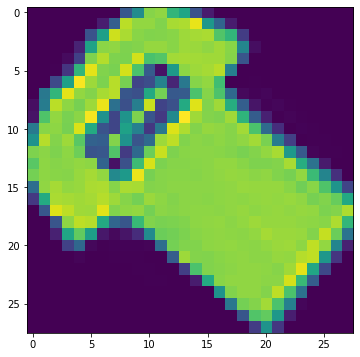

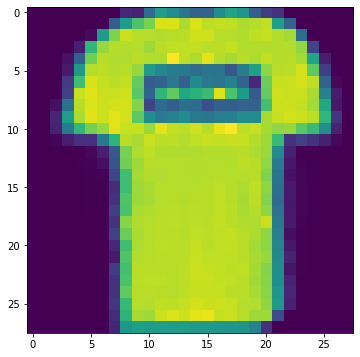

"\ncv.imshow('Source image', src)\ncv.imshow('Warp', warp_dst)\ncv.imshow('Warp + Rotate', warp_rotate_dst)\ncv.waitKey()\n"

In [18]:
src=warp_rotate_dst
srcTri = np.array( [[0, 0], [src.shape[1] - 1, 0], [0, src.shape[0] - 1]] ).astype(np.float32)
dstTri = np.array( [[0, src.shape[1]*0.33], [src.shape[1]*0.85, src.shape[0]*0.25], [src.shape[1]*0.15, src.shape[0]*0.7]] ).astype(np.float32)
warp_mat = cv.getAffineTransform(srcTri, dstTri)
warp_dst = cv.warpAffine(src, warp_mat, (src.shape[1], src.shape[0]))

# Rotating the image after Warp
center = (warp_dst.shape[1]//2, warp_dst.shape[0]//2)
angle = 310
scale = 1

rot_mat = cv.getRotationMatrix2D( center, angle, scale )
warp_rotate_dst = cv.warpAffine(src, rot_mat, (src.shape[1], src.shape[0]))
#warp_rotate_dst = cv.warpAffine(warp_dst, rot_mat, (warp_dst.shape[1], warp_dst.shape[0]))
fig = plt.figure( figsize=(8, 6))
plt.imshow(src, cmap='viridis')
plt.show()
"""
fig = plt.figure( figsize=(8, 6))
plt.imshow(warp_dst, cmap='viridis')
plt.show()
"""
fig = plt.figure( figsize=(8, 6))
plt.imshow(warp_rotate_dst, cmap='viridis')
plt.show()
"""
cv.imshow('Source image', src)
cv.imshow('Warp', warp_dst)
cv.imshow('Warp + Rotate', warp_rotate_dst)
cv.waitKey()
"""

## Completion Bar

In [118]:
import time, sys
from IPython.display import clear_output

def update_progress(progress):
    bar_length = 20
    if isinstance(progress, int):
        progress = float(progress)
    if not isinstance(progress, float):
        progress = 0
    if progress < 0:
        progress = 0
    if progress >= 1:
        progress = 1

    block = int(round(bar_length * progress))

    clear_output(wait = True)
    text = "Progress: [{0}] {1:.1f}%".format( "#" * block + "-" * (bar_length - block), progress * 100)
    print(text)

## Establishing Control metrics

In [12]:
neighbors=15
dim=2
epochs=500
dist=.2

In [13]:
reducer = umap.UMAP(random_state=42,n_epochs=epochs,n_components=dim, n_neighbors=neighbors,min_dist=dist,verbose=1)
embedding_control_2d = reducer.fit_transform(data)

UMAP(min_dist=0.2, n_epochs=500, random_state=42, verbose=1)
Tue Oct 11 08:53:21 2022 Construct fuzzy simplicial set
Tue Oct 11 08:53:22 2022 Finding Nearest Neighbors
Tue Oct 11 08:53:22 2022 Building RP forest with 18 trees
Tue Oct 11 08:53:23 2022 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Tue Oct 11 08:53:36 2022 Finished Nearest Neighbor Search
Tue Oct 11 08:53:39 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Oct 11 08:55:27 2022 Finished embedding


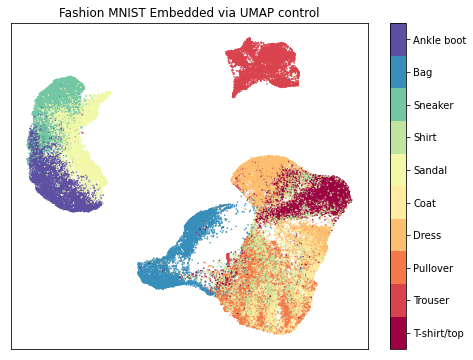

In [14]:
target = np.hstack([train_labels, test_labels])

fig, ax = plt.subplots(1, figsize=(8, 6))
plt.scatter(*embedding_control_2d.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(classes)
plt.title('Fashion MNIST Embedded via UMAP control');

## Scrambling the data
During this step its important to ensure that we end up with a set of rotated images such that they have uniform matrix dimensions 


In [133]:
def rotate(theta,image):
    theta=math.radians(theta)                               #converting degrees to radians
    cosine=math.cos(theta)
    sine=math.sin(theta)


    # Compute augmented image dimensions
    new_height  = round(abs(image.shape[0]*cosine)+abs(image.shape[1]*sine))+1
    new_width  = round(abs(image.shape[1]*cosine)+abs(image.shape[0]*sine))+1

    #init temp matrix to be populated with individually rotated elements
    output=np.zeros((new_height,new_width))

    # Identify point of rotation in original image
    original_centre_height   = round(((image.shape[0]+1)/2)-1)    #with respect to the original image
    original_centre_width    = round(((image.shape[1]+1)/2)-1)    #with respect to the original image

    # Find the centre of the new image that will be obtained
    new_centre_height= round(((new_height+1)/2)-1)        #with respect to the new image
    new_centre_width= round(((new_width+1)/2)-1)          #with respect to the new image
    
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            #co-ordinates of pixel with respect to the centre of original image
            y=image.shape[0]-1-i-original_centre_height                   
            x=image.shape[1]-1-j-original_centre_width 

            #Applying shear Transformation                     
            new_y,new_x=shear(theta,x,y)

            #Adjust coordinates to be relative to the new center after rotation
            new_y=new_centre_height-new_y
            new_x=new_centre_width-new_x
            if(new_x>=np.shape(image)[0]):
                new_x=np.shape(image)[0]-1
            if(new_y>=np.shape(image)[1]):
                new_y=np.shape(image)[1] -1   
           
             #writing the pixels to the new destination in the output image
            output[new_y,new_x]=image[i,j]                         

    #return output
"""
    #trim output: 
    # iterate through matrix, if there exists an element less than tau round it down to 0
    tau=.1
    for j in range(output.shape[0]):
        for k in range(output.shape[0]):
            if output[j][k]<tau:
                output[j][k]=np.rint(output[j][k])
    # identify indices of zero rows and columns and delete them from the final matrix( could be done with less lines )
    idx = np.argwhere(np.all(output[..., :] == 0, axis=0))
    o2 = np.delete(output, idx, axis=0)
    idy = np.argwhere(np.all(output[..., :] == 0, axis=1))
    o3= np.delete(o2, idy, axis=1)
    return o3           
"""
    
   

'\n    #trim output: \n    # iterate through matrix, if there exists an element less than tau round it down to 0\n    tau=.1\n    for j in range(output.shape[0]):\n        for k in range(output.shape[0]):\n            if output[j][k]<tau:\n                output[j][k]=np.rint(output[j][k])\n    # identify indices of zero rows and columns and delete them from the final matrix( could be done with less lines )\n    idx = np.argwhere(np.all(output[..., :] == 0, axis=0))\n    o2 = np.delete(output, idx, axis=0)\n    idy = np.argwhere(np.all(output[..., :] == 0, axis=1))\n    o3= np.delete(o2, idy, axis=1)\n    return o3           \n'

In [105]:
# A shear is used here to avoid issues with anti aliasing, method described by 
#vhttps://www.ocf.berkeley.edu/~fricke/projects/israel/paeth/rotation_by_shearing.html
def shear(angle,x,y):
    '''
    |1  -tan(𝜃/2) |  |1        0|  |1  -tan(𝜃/2) | 
    |0      1     |  |sin(𝜃)   1|  |0      1     |
    '''
    
    tangent=math.tan(angle/2)
    new_x=round(x-y*tangent)
    new_y=y
 
    new_y=round(new_x*math.sin(angle)+new_y)      #since there is no change in new_x according to the shear matrix
    new_x=round(new_x-new_y*tangent)              #since there is no change in new_y according to the shear matrix
   
    return new_y,new_x

In [31]:
#Generate list of rotations to randomly choose from 
N=10
phi = np.linspace(-N,N,1000)
phi = phi%(2*math.pi)
phi=np.degrees(phi)
phi=(np.floor(phi))
phi=phi.astype('int32')
print(np.random.choice(phi))

130


This process takes quite a while to compelte it might be worth saving this as a data set at some point, I will further consider this once I have cleaned up the matrices to have uniform size 

In [194]:
r_data_control=[]
for i in range(np.shape(data)[0]):
    theta=np.random.choice(phi)
    #print(i,theta)
    r_data_control.append(rotate(np.random.choice(phi),np.reshape(data[i],(28,28))))
    update_progress(i / np.shape(data)[0])

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [195]:
m=0
for i in range(np.shape(data)[0]):
    if np.shape(r_data[i])[0]>m:
        m= np.shape(r_data[i])[0]
print(m)

41


So all matrices need to be padded out to 41 to support further UMAP usage Experimenting on one sample now

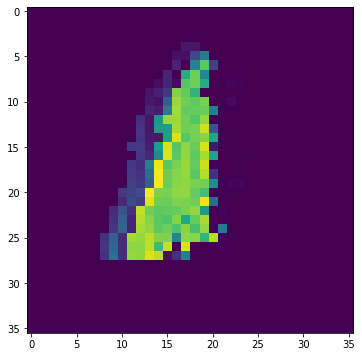

(36, 36)
(36, 41)


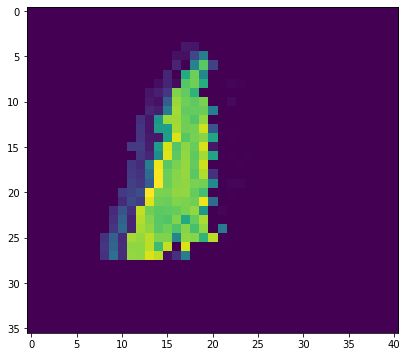

(41, 41)


In [164]:
#b = cnumpy.append(a,numpy.zeros([len(a),1]),1)
fig = plt.figure( figsize=(8, 6))
plt.imshow(r_data[6], cmap='viridis')
plt.show()
#fig = plt.figure( figsize=(8, 6))
#plt.imshow(np.reshape(data[6],(28,28)), cmap='viridis')
#plt.show()

c=r_data[6]
print(c.shape)
c=np.append(c,np.zeros([len(c),m-np.shape(c)[0]]),1)
print(c.shape)
fig = plt.figure( figsize=(8, 6))
plt.imshow(c, cmap='viridis')
plt.show()
z=np.zeros((m-np.shape(c)[0],np.shape(c)[1]))
c=np.vstack((c,z))
print(c.shape)

In [198]:
#Pad all matrices to max size 

for i in range(np.shape(data)[0]):
    diff=m-np.shape(r_data[i])[1]
    #print(np.shape(r_data[i])[0])
    if np.shape(r_data[i])[1]<m:
        r_data[i]=np.append(r_data[i],np.zeros((len(r_data[i]),diff)),1)
        #z=np.zeros((np.shape(r_data[i])[1],diff))
        #print(z.shape)
        #print(r_data[i].shape)
        #r_data[i]=np.hstack((r_data[i],z))
    if np.shape(r_data[i])[0]<m:
        z=np.zeros((diff,np.shape(r_data[i])[1]))
        r_data[i]=np.vstack((r_data[i],z))


In [197]:
for i in range(np.shape(data)[0]):
    print(np.shape(r_data[i]))

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(41, 41)
(

In [212]:
print(data.shape)
vectorize_r_data=np.zeros((np.shape(data)[0],41**2))
for i in range(len(r_data)):
    vectorize_r_data[i]=r_data[i].reshape((41**2))
print(vectorize_r_data.shape)

(70000, 784)
(70000, 1681)


In [213]:
reducer = umap.UMAP(random_state=42,n_epochs=epochs,n_components=dim, n_neighbors=neighbors,min_dist=dist,verbose=1)
embedding_chaos = reducer.fit_transform(np.asarray(vectorize_r_data))

UMAP(min_dist=0.2, n_epochs=500, random_state=42, verbose=1)
Tue Oct 11 10:53:18 2022 Construct fuzzy simplicial set
Tue Oct 11 10:53:18 2022 Finding Nearest Neighbors
Tue Oct 11 10:53:18 2022 Building RP forest with 18 trees
Tue Oct 11 10:53:21 2022 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Tue Oct 11 10:53:24 2022 Finished Nearest Neighbor Search
Tue Oct 11 10:53:24 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Oct 11 10:55:09 2022 Finished embedding


In [215]:
target = np.hstack([train_labels, test_labels])

fig, ax = plt.subplots(1, figsize=(8, 6),dpi=1400)
plt.scatter(*embedding_chaos.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(classes)
plt.title('Fashion MNIST Embedded via UMAP control');

In [217]:
reducer = umap.UMAP(random_state=42,n_epochs=epochs,n_components=3, n_neighbors=neighbors,min_dist=dist,verbose=1)
embedding_chaos_3d = reducer.fit_transform(np.asarray(vectorize_r_data))

UMAP(min_dist=0.2, n_components=3, n_epochs=500, random_state=42, verbose=1)
Tue Oct 11 10:58:18 2022 Construct fuzzy simplicial set
Tue Oct 11 10:58:18 2022 Finding Nearest Neighbors
Tue Oct 11 10:58:18 2022 Building RP forest with 18 trees
Tue Oct 11 10:58:21 2022 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Tue Oct 11 10:58:24 2022 Finished Nearest Neighbor Search
Tue Oct 11 10:58:24 2022 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Oct 11 11:00:26 2022 Finished embedding


<IPython.core.display.Javascript object>


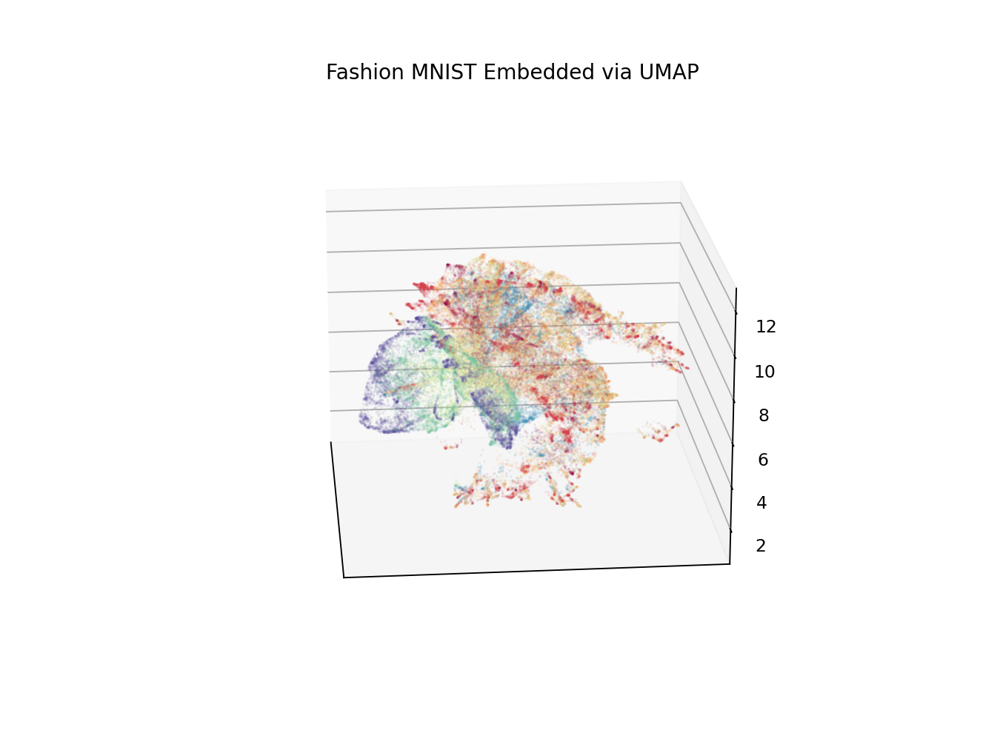

In [223]:
%matplotlib notebook

fig = plt.figure( figsize=(8, 6),dpi=150)
ax = fig.add_subplot(111, projection='3d')

ax.scatter(*embedding_chaos_3d.T, c=target, s=.2,cmap='Spectral',alpha=.1)
#plt.scatter(*embedding.T, s=0.3, c=target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])

plt.title('Fashion MNIST Embedded via UMAP');

In [ ]:
#for i in range(np.shape(r_data)[0]):
t=r_data[i]
U,S,V=la.svd(t)
norms=[]

for i in range(90):
    if la.norm(U-np.eye((np.shape(U)[0]),(np.shape(U)[0])))>1: 
        norms.append(la.norm(U-np.eye((np.shape(U)[0]),(np.shape(U)[0]))))
        print(norms[i])
        #print(la.norm(U-np.eye((np.shape(U)[0]),(np.shape(U)[0]))))
        t=rotate(4*i,t)
        print(t.shape)
        U,S,V=la.svd(t)    


9.15415956216967
(41, 41)
(42, 42)
(42, 42)
9.262755383235726
(42, 42)
(46, 46)
(46, 46)
9.55713266840964
(46, 46)
(53, 53)
(53, 53)
10.418525478320722
(53, 53)
(64, 64)
(64, 64)
11.155714198238597
(64, 64)
(80, 80)
(80, 80)
12.674043846200078
(80, 80)
(104, 104)
(104, 104)
13.16654952665446
(104, 104)
(138, 138)
(138, 138)
14.481286979665123
(138, 138)
(188, 188)
(188, 188)
16.06237840420901
(188, 188)
(260, 260)
(260, 260)
17.841127380273864
(260, 260)
(364, 364)
(364, 364)
20.73644135332772
(364, 364)
(514, 514)
(514, 514)
10.463967101979941
(514, 514)
(728, 728)
(728, 728)
10.282826042425258
(728, 728)
(1029, 1029)
(1029, 1029)
33.406586176980134
(1029, 1029)
(1445, 1445)
(1445, 1445)
39.14077158156185
(1445, 1445)
(2007, 2007)
(2007, 2007)
45.66890256682316
(2007, 2007)
(2743, 2743)
(2743, 2743)
52.99233797842005
(2743, 2743)
(3669, 3669)
(3669, 3669)
61.106464469808756
(3669, 3669)
(4777, 4777)
(4777, 4777)
9.730550716586265
(4777, 4777)
(6020, 6020)
(6020, 6020)
78.0768851837725